<a href="https://colab.research.google.com/github/yrodriguezmd/Surgical_instruments/blob/main/project/Surg600/notebooks/Surg100_500_oct7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
!bash install_colab.sh

--2021-10-07 23:23:24--  https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 595 [text/plain]
Saving to: ‘install_colab.sh’

install_colab.sh    100%[===================>]     595  --.-KB/s    in 0s      

2021-10-07 23:23:24 (26.3 MB/s) - ‘install_colab.sh’ saved [595/595]

- Installing mmcv
installing mmcv-full from wheel.
Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html
     |████████████████████████████████| 36.7 MB 55 kB/s 
     |████████████████████████████████| 185 kB 14.6 MB/s 
- Installing mmdet
installing mmdet from https://github.com/open-mmlab/mmdetection.git.
Cloning into '/tmp/tmph37k4en9/mmdetection'...
remote: Enumerating objects: 211

In [ ]:
exit()

In [ ]:
import icevision

INFO     - Downloading default `.ttf` font file - SpaceGrotesk-Medium.ttf from https://raw.githubusercontent.com/airctic/storage/master/SpaceGrotesk-Medium.ttf to /root/.icevision/fonts/SpaceGrotesk-Medium.ttf | icevision.visualize.utils:get_default_font:70
INFO     - Downloading mmdet configs | icevision.models.mmdet.download_configs:download_mmdet_configs:31


0B [00:00, ?B/s]

In [ ]:
from icevision.all import *
print('icevision v',icevision.__version__)
print('torch v',torch.__version__)
print('torchvision v',torchvision.__version__)

icevision v 0.10.0a1
torch v 1.9.0+cu111
torchvision v 0.10.0+cu111


Previous work:

Inference for Surg500 needs further improvement.  Pseudolabels refined.  Merged to come up with Surg100_500.

Objective:

Fine-tune vfnet using Surg100_500.  Use Surg600 for inference

In [ ]:
!git clone https://github.com/yrodriguezmd/Surgical_instruments.git

Cloning into 'Surgical_instruments'...
remote: Enumerating objects: 1820, done.
remote: Counting objects: 100% (540/540), done.
remote: Compressing objects: 100% (532/532), done.
remote: Total 1820 (delta 103), reused 2 (delta 2), pack-reused 1280
Receiving objects: 100% (1820/1820), 73.78 MiB | 25.63 MiB/s, done.
Resolving deltas: 100% (323/323), done.


In [ ]:
# temporary Surg100_300 uploaded in Colab
!ls Surgical_instruments/project/Merged

Full  README.md  Surg100_200


Use merged Surg100_500 to finetune VFnet

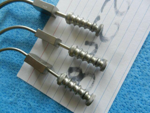

In [ ]:
#image_path = Path('.')
image_path = Path('Surgical_instruments/project/Merged/Full')

## images better in a folder
img_files = get_image_files(image_path)

img = PIL.Image.open(img_files[401]) ##
img = img.convert('RGB')

img.to_thumb(150,150)

In [ ]:
# now using actual classes, not coco
import pandas as pd
df = pd.read_csv('Surgical_instruments/project/Merged/Surg100_200/_annotations.csv')
df.rename(columns = {'class':'label'},inplace=True)
classes = df.label.unique().tolist()
class_map = ClassMap(classes) ## resolved pickle error
len(class_map)

16

In [ ]:
## temporary
#parser = parsers.COCOBBoxParser(
#    annotations_filepath = Path('./_annotations_300.coco.json'),
#    img_dir = Path('.', mask=False))

In [ ]:
parser = parsers.COCOBBoxParser(
    annotations_filepath = Path('./Surgical_instruments/project/Merged/Full/annotations/_annotations_500.coco.json'),
    img_dir = Path('./Surgical_instruments/project/Merged/Full/', mask=False))

In [ ]:
train_records, valid_records = parser.parse()

  0%|          | 0/731 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/473 [00:00<?, ?it/s]

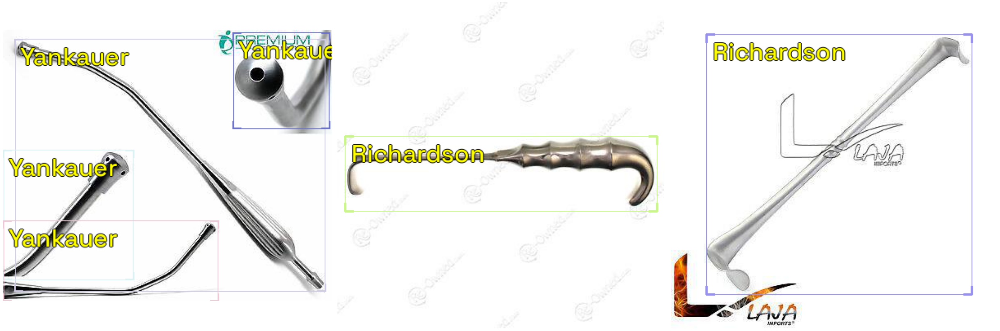

In [ ]:
show_records(train_records[300:303],ncols=3, font_size=30, label_color = '#ffff00')

Fine tune VFnet using Surg100_500

In [ ]:
#from icevision.models.checkpoint import *

In [ ]:
#model_type = models.mmdet.vfnet ##
#backbone = model_type.backbones.resnet50_fpn_mstrain_2x##

#model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(classes),)# **extra_args) 

In [ ]:
presize = 512
image_size = 384

train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=image_size), tfms.A.Normalize()])

#https://github.com/airctic/icevision/blob/62efacad80e44ecf9f506137e6c52acad2640c1e/icevision/tfms/albumentations/albumentations_helpers.py

In [ ]:
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

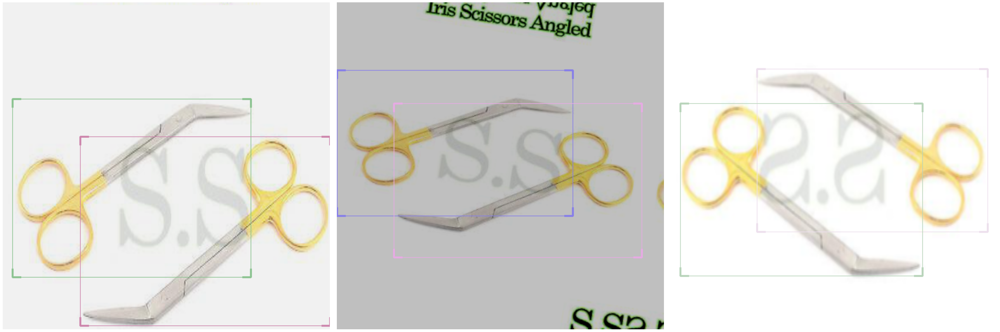

In [ ]:
samples = [train_ds[6] for _ in range(3)]
show_samples(samples, ncols=3, display_label=False)

In [ ]:
#metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

from icevision.models.checkpoint import *

model_type = models.mmdet.vfnet ##
backbone = model_type.backbones.resnet50_fpn_mstrain_2x ##

model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(classes),)# **extr

#https://paperswithcode.com/lib/mmdetection/vfnet
#mAP 44.5

In [ ]:
backbone.__dict__

{'config_path': Path('/root/.icevision/mmdetection_configs/mmdetection_configs-2.16.0/configs/vfnet/vfnet_r50_fpn_mstrain_2x_coco.py'),
 'model_name': 'vfnet',
 'pretrained': True,
 'weights_url': 'https://openmmlab.oss-cn-hangzhou.aliyuncs.com/mmdetection/v2.0/vfnet/vfnet_r50_fpn_mstrain_2x_coco/vfnet_r50_fpn_mstrain_2x_coco_20201027-7cc75bd2.pth'}

In [ ]:
train_dl = model_type.train_dl(train_ds, batch_size = 16, num_workers = 4,
                               shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=16, num_workers = 4,
                               shuffle=False)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

learn = model_type.fastai.learner(dls = [train_dl, valid_dl],
                                  model = model, metrics = metrics)

/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


SuggestedLRs(valley=0.005248074419796467)

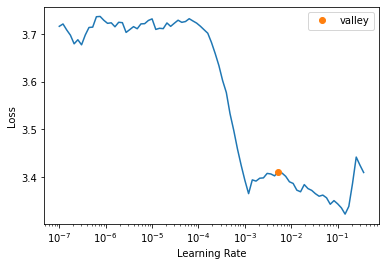

In [ ]:
learn.lr_find()

In [ ]:
learn.fine_tune(20, 0.001)
# poor learning at lr 0.005, 0.0005

epoch,train_loss,valid_loss,COCOMetric,time
0,1.691657,2.239879,0.167324,00:26


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


epoch,train_loss,valid_loss,COCOMetric,time
0,1.713681,2.188433,0.178312,00:28
1,1.671960,2.242840,0.172281,00:28
2,1.648651,2.260633,0.192849,00:28
3,1.646317,2.106732,0.169063,00:28
4,1.648022,2.160686,0.203869,00:28
5,1.649025,2.190891,0.233837,00:28
6,1.639213,2.157931,0.214515,00:28
7,1.616972,2.184943,0.255628,00:28
8,1.597051,1.961904,0.271313,00:28
9,1.557985,2.034029,0.279976,00:28


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


SuggestedLRs(valley=2.511886486900039e-05)

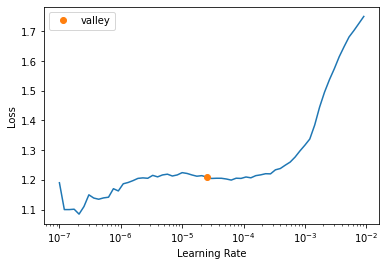

In [ ]:
learn.lr_find()

In [ ]:
learn.fine_tune(20, 2.5e-5)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.233654,2.006409,0.393658,00:26


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


epoch,train_loss,valid_loss,COCOMetric,time
0,1.205534,2.009214,0.392128,00:28
1,1.199433,2.007550,0.392628,00:28
2,1.206165,2.009682,0.389254,00:28
3,1.210617,2.026627,0.384753,00:28
4,1.200148,2.014664,0.392382,00:28
5,1.190133,2.017742,0.394417,00:28
6,1.184287,2.030002,0.392752,00:28
7,1.177630,2.033175,0.386396,00:28
8,1.175204,2.044850,0.390228,00:28
9,1.179029,2.029724,0.388191,00:28


In [ ]:
torch.save(model.state_dict(), 'Surg100_500modeldict.pth')
#torch.save(optimizer.state_dict(), 'Surg100_500optdict.pth')
#torch.save(scheduler.state_dict(), 'Surg100_500scheddict.pth')

In [ ]:
!ls

checkpoints	  models       Surg100_500modeldict.pth
install_colab.sh  sample_data  Surgical_instruments


In [ ]:
model_type = models.mmdet.vfnet ##
backbone = model_type.backbones.resnet50_fpn_mstrain_2x ##
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(classes),)# **extr

model.load_state_dict(torch.load('Surg100_500modeldict.pth'))

Open new notebook, see if can load saved model.  --> runs long, gives error:  RuntimeError: PytorchStreamReader failed reading zip archive: failed finding central directory

https://colab.research.google.com/drive/1rObiCFHbcI5BNzKL6uVOa2s6q8Pixkzl#scrollTo=JiXss3GaQ7dk

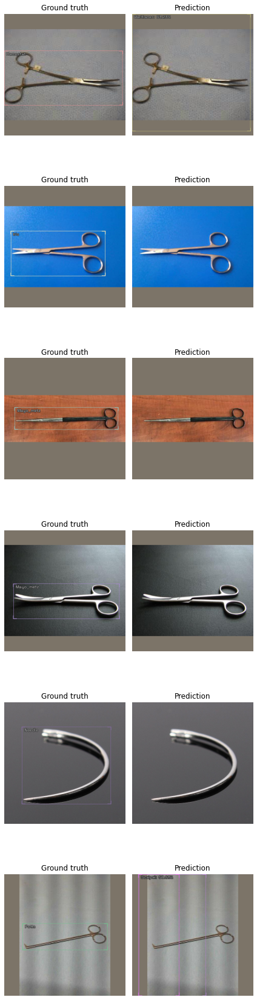

In [ ]:
model_type.show_results(model, valid_ds)

Results not yet good.  Try further training.

/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


SuggestedLRs(valley=9.999999747378752e-06)

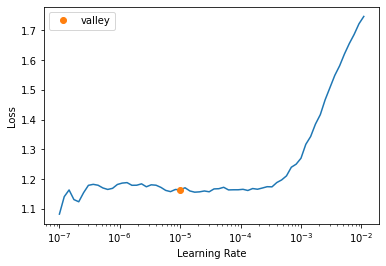

In [ ]:
learn.lr_find()

In [ ]:
learn.unfreeze()
learn.fit_one_cycle(10, 1e-5) #epoch50

epoch,train_loss,valid_loss,COCOMetric,time
0,1.172746,2.025433,0.389716,00:28
1,1.185482,2.035164,0.381154,00:28
2,1.166266,2.008646,0.389407,00:28
3,1.166328,2.074490,0.386714,00:28
4,1.171232,2.059222,0.382585,00:28
5,1.171951,2.036875,0.388413,00:28
6,1.158198,2.055760,0.383694,00:28
7,1.153554,2.047013,0.386343,00:28
8,1.164245,2.046901,0.388157,00:28
9,1.160976,2.046142,0.386967,00:28


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


In [ ]:
learn.fit_one_cycle(10, 5e-5) #epoch60

epoch,train_loss,valid_loss,COCOMetric,time
0,1.150112,2.035490,0.391388,00:28
1,1.161533,2.148586,0.371472,00:28
2,1.193960,2.102499,0.360776,00:28
3,1.194828,2.089378,0.341728,00:28
4,1.192655,2.096006,0.361497,00:28
5,1.175581,2.040525,0.396687,00:28
6,1.168120,2.071100,0.385613,00:28
7,1.153340,2.059047,0.398336,00:28
8,1.132837,2.034139,0.403715,00:27
9,1.128632,2.030000,0.404471,00:28


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


In [ ]:
learn.fit_one_cycle(10, 5e-5) #epoch70
## not learning

epoch,train_loss,valid_loss,COCOMetric,time
0,1.085417,2.039302,0.407351,00:28
1,1.099175,2.016404,0.409964,00:28
2,1.131226,2.174764,0.351385,00:28
3,1.135014,2.159253,0.390732,00:28
4,1.122129,2.147516,0.376898,00:28
5,1.127332,2.094515,0.404437,00:28
6,1.108904,2.069731,0.399415,00:28
7,1.089285,2.093444,0.399491,00:28
8,1.084494,2.110377,0.404699,00:28
9,1.072174,2.113191,0.406639,00:28


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


In [ ]:
checkpoint_path =  'Surg100_500_mAP40'##

save_icevision_checkpoint(model, 
                        model_name='mmdet.vfnet',## 
                        backbone_name='resnet50_fpn_mstrain_2x',
                        classes =  parser.class_map.get_classes(), 
                        img_size=image_size, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})

# saved to colab files

In [ ]:
!ls

checkpoints	  models       Surg100_500_mAP40	 Surgical_instruments
install_colab.sh  sample_data  Surg100_500modeldict.pth


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount = True)
root_dir = Path('/content/gdrive/MyDrive')

Mounted at /content/gdrive


In [ ]:
checkpoint_path =  '/content/gdrive/MyDrive/models/Surg100_500_mAP40.pth'##

save_icevision_checkpoint(model, 
                        model_name='mmdet.vfnet',## 
                        backbone_name='resnet50_fpn_mstrain_2x',
                        classes =  parser.class_map.get_classes(), 
                        img_size=image_size, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})

## saved to drive

In [ ]:
!ls gdrive/MyDrive/models

bccd-faster-rcnn-best.pth  Surg100_400mAP60.5.pth  wheat-eff-best.pth
bccd-faster-rcnn.pth	   Surg100_500_mAP40	   wheat-mmdet_retinanet.pth
plantdoc-yolov5.pth	   Surg100_500_mAP40.pth   wheat-yolo-best-4th.pth
Surg100_400mAP60	   Surg100_vfnet-2.pth
Surg100_400mAP60.5	   Surg100_vfnet-best.pth


In [ ]:
checkpoint_and_model = model_from_checkpoint('./content/gdrive/MyDrive/modelsSurg100_500mAP40.pth')

model = checkpoint_and_model['model']
#OSError: Surg100_400mAP60.5.pth is not a checkpoint file
# modifications in path not effective

Use load_from_local loader


OSError: ignored

In [ ]:
checkpoint_path =  'Surg100_500_mAP40'##

save_icevision_checkpoint(model, 
                        model_name='mmdet.vfnet',## 
                        backbone_name='resnet50_fpn_mstrain_2x',
                        classes =  parser.class_map.get_classes(), 
                        img_size=image_size, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})

In [ ]:
checkpoint_and_model = model_from_checkpoint(checkpoint_path)

model = checkpoint_and_model['model']
#https://github.com/airctic/icevision/blob/9f23f35d1781fde39f7fe6935f58ef0a4a1940e0/icevision/models/checkpoint.py

Inference

In [ ]:
## temporary: after loading Surg600 in github
!git clone https://github.com/yrodriguezmd/Surgical_instruments.git

fatal: destination path 'Surgical_instruments' already exists and is not an empty directory.


In [ ]:
!ls Surgical_instruments/project/Surg600

notebooks  raw_images  Surg_600_ann_coco


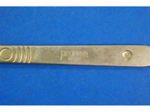

In [ ]:
image_path = Path('./Surgical_instruments/project/Surg600/raw_images')
#image_path = Path('Surgical_instruments/project/Merged/Surg100_200/train')

## images better in a folder
img_files = get_image_files(image_path)

img = PIL.Image.open(img_files[0]) ##
img = img.convert('RGB')

img.to_thumb(150,150)

In [ ]:
model.eval()

imgs_array = [PIL.Image.open(file) for file in img_files]

imgs_array = [image.convert('RGB') for image in imgs_array]

img_size = 384 

valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])

infer_ds = Dataset.from_images(imgs_array, valid_tfms, class_map = class_map)

In [ ]:
# generating pseudolabels
infer_dl = model_type.infer_dl(infer_ds, batch_size=4, shuffle=False)

preds_saved = model_type.predict_from_dl(model, infer_dl,
                                          keep_images=True,) 
## got can't pickle error which was resolved by using ClassMap

  0%|          | 0/25 [00:00<?, ?it/s]

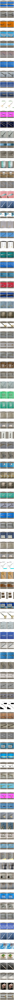

In [ ]:
show_preds(preds_saved, font_size=30, label_color='#ffff00')

Results: Poor mAP, no predictions.

Try again.

In [ ]:
learn = model_type.fastai.learner(dls = [train_dl, valid_dl],
                                  model = model, metrics = metrics)

/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


SuggestedLRs(valley=0.0012022644514217973)

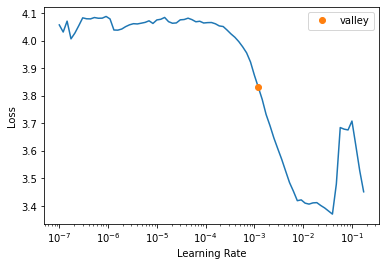

In [ ]:
learn.lr_find()

In [ ]:
learn.fine_tune(20, 0.0012022644514217973)
# despite rerunning learn prior to fine_tune,
#   it seems that it continued from the last run, 
#   however, last run's mAP was 60

epoch,train_loss,valid_loss,COCOMetric,time
0,3.194982,2.303025,0.146074,00:26


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


epoch,train_loss,valid_loss,COCOMetric,time
0,1.772133,1.958652,0.243044,00:28
1,1.671197,1.969046,0.295003,00:29
2,1.583622,1.991237,0.307674,00:28
3,1.522900,2.087293,0.315650,00:28
4,1.509730,2.061841,0.241282,00:28
5,1.517554,1.977365,0.351857,00:28
6,1.523877,2.129477,0.296578,00:28
7,1.495818,2.052494,0.350883,00:28
8,1.435517,2.051235,0.383524,00:28
9,1.399590,1.961502,0.407278,00:28


In [ ]:
checkpoint_path =  'Surg100_400_mAP53.pth'## should be 500!

save_icevision_checkpoint(model, 
                        model_name='mmdet.vfnet',## 
                        backbone_name='resnet50_fpn_mstrain_2x',
                        classes =  parser.class_map.get_classes(), 
                        img_size=image_size, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})

# saved to colab files

In [ ]:
learn.unfreeze()
learn.fit_one_cycle(10, 0.0012022644514217973)
# poor further learning

In [ ]:
checkpoint_and_model = model_from_checkpoint(checkpoint_path)

model = checkpoint_and_model['model']

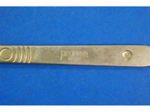

In [ ]:
image_path = Path('./Surgical_instruments/project/Surg600/raw_images')
#image_path = Path('Surgical_instruments/project/Merged/Surg100_200/train')

## images better in a folder
img_files = get_image_files(image_path)

img = PIL.Image.open(img_files[0]) ##
img = img.convert('RGB')

img.to_thumb(150,150)

In [ ]:
model.eval()

imgs_array = [PIL.Image.open(file) for file in img_files]

imgs_array = [image.convert('RGB') for image in imgs_array]

img_size = 384 

valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])

infer_ds = Dataset.from_images(imgs_array, valid_tfms, class_map = class_map)

In [ ]:
# generating pseudolabels
infer_dl = model_type.infer_dl(infer_ds, batch_size=4, shuffle=False)

preds_saved = model_type.predict_from_dl(model, infer_dl,
                                          keep_images=True,) 
## got can't pickle error which was resolved by using ClassMap

  0%|          | 0/25 [00:00<?, ?it/s]

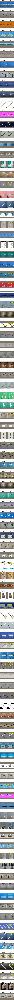

In [ ]:
# preds at mAP 67
show_preds(preds_saved, font_size=30, label_color='#ffff00')

Good bboxes, poor predictions.

Use pseudolabels.

In [67]:
#skip if predictions not good
for pred in preds_saved:
  pred.add_component(FilepathRecordComponent())

for _ in range(len(preds_saved)): 
  preds_saved[_].set_filepath(img_files[_]) 

conv = convert_preds_to_coco_style(preds_saved) 

In [68]:
#skip
add_info = {
    "info": {
    "description": "Surgery Instruments",
    "url": "http://cocodataset.org",
    "version": "1.0",
    "year": 2021,
    "contributor": "MR",
    "date_created": "2021/09/27"
    },
  "categories": [  ## adjusted
   {
            "id": 0,
            "name": "instruments",
            "supercategory": "none"
        },
        {
            "id": 1,
            "name": "Army_navy",
            "supercategory": "Retractor"
        },
        {
            "id": 2,
            "name": "Bulldog",
            "supercategory": "Clamp"
        },
        {
            "id": 3,
            "name": "Castroviejo",
            "supercategory": "Needle_holder"
        },
        {
            "id": 4,
            "name": "Forceps",
            "supercategory": "Forceps"
        },
        {
            "id": 5,
            "name": "Frazier",
            "supercategory": "Suction"
        },
        {
            "id": 6,
            "name": "Hemostat",
            "supercategory": "Clamp"
        },
        {
            "id": 7,
            "name": "Iris",
            "supercategory": "Scissors"
        },
        {
            "id": 8,
            "name": "Mayo_metz",
            "supercategory": "Scissors"
        },
        {
            "id": 9,
            "name": "Needle",
            "supercategory": "Needle"
        },
        {
            "id": 10,
            "name": "Potts",
            "supercategory": "Scissors"
        },
        {
            "id": 11,
            "name": "Richardson",
            "supercategory": "Retractor"
        },
        {
            "id": 12,
            "name": "Scalpel",
            "supercategory": "Scalpel"
        },
        {
            "id": 13,
            "name": "Towel_clip",
            "supercategory": "Clamp"
        },
        {
            "id": 14,
            "name": "Weitlaner",
            "supercategory": "Retractor"
        },
        {
            "id": 15,
            "name": "Yankauer",
            "supercategory": "Suction"
        }
    ],
 }

In [69]:
annot = {**add_info, **conv}

f = open('annot.json','w') 
f.write(str(annot)) 
f.close()
## download and adjust ' to "
#### cannot see files in Colab

### alternate: go straight to Roboflow and google mount
#from google.colab import drive
#drive.mount('/content/gdrive', force_remount = True)
#root_dir = Path('/content/gdrive/MyDrive')

In [70]:
# temporary because colab doesn't show files
from google.colab import files
files.download('annot.json')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Annot adjusted.

For uploading of pseudolabels to roboflow for refinement.

Retained codes for future use

In [ ]:
checkpoint_path = 'Surg100_vfnet.pth'

save_icevision_checkpoint(model, 
                        model_name='mmdet.vfnet',## 
                        backbone_name='resnet50_fpn_mstrain_2x',
                        classes =  parser.class_map.get_classes(), 
                        img_size=image_size, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})

In [ ]:
!ls # with Surg100_ret_b.pth

annot.json   install_colab.sh	      sample_data	 Surg100_vfnet.pth
checkpoints  models		      Surg100_ret_b.pth  Surgical_instruments
gdrive	     pilot15_for_pseudolabel  Surg100_ret.pth
http:	     pilot15_ret.pth	      Surg100_vf_b.pth


In [ ]:
checkpoint_and_model = model_from_checkpoint(checkpoint_path)

In [ ]:
# using finetune
model = checkpoint_and_model['model']
#model